In [1]:
import os
os.chdir('../') 

In [2]:
from lib.readfile import ReadFile as rf
from lib.handle_null_values import handle_null_values as null
from lib.datetime_formatting import DatetimeFormatting as dfmt
from lib.split_time_variable import split_time_variable as split_t
from lib.correct_variable_types import correct_variable_types as vartype
from lib.handle_null_values import handle_null_values as nulval

/Users/muddassarsharif/Desktop/muddassar/production/API/env4/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [3]:
"""Read the file"""

r= rf()
df= r.read(address="lib/data/tbl_property_details_mls_2019.csv")

In [4]:
"""Remove column with null values"""

n= null()
variables= n.delete_var_with_null_more_than(df, percentage=20)

In [5]:
"""drop unwanted variables for now"""

df2= df.drop(*variables)

In [6]:
"""select important variables""" 

important_variables=['year_built', 'bedroom_count', 'bathroom_count','lot_size', 'area', 'city_name', 'community_name', 'covered_parking', 'exterior', 'energy_source','fireplaces_count', 'floor_covering', 'garage','heating_cooling','latitude','longitude', 'property_type', 'roof', 'sold_date', 'sold_price','unfinished_sq_foot', 'year_built', 'zip_code', 'county' ]

    
important_variables= list(set(important_variables))
df3= df2.select(*important_variables)


In [7]:
"""concatenate all files"""

# files= ["09"]
# for f_no in range(10, 20):
#     files.append(f_no)    
    
#     df4= r.read(address="lib/data/20"+str(f_no)+".csv")
#     df4= df4.select(*important_variables)
#     df3 = df3.union(df4)

file= "tbl_property_details_mls_2019"
for f_no in range(1):  
    
    df4= r.read(address="lib/data/"+file+".csv")
    df4= df4.select(*important_variables)
    df3 = df3.union(df4)

In [7]:
"""filter one county from the dataset"""

df5= df3.filter( df3["county"].isin(["Pierce"]))


In [8]:
"""correct time format"""

f= split_t()

#Assuming time variable is in timestamp type
df6= f.run(df5)


In [9]:
"""Split time variable"""


# from pyspark.sql.functions import isnan, when, count, col, from_unixtime
# from pyspark.sql.types import DoubleType, TimestampType
# from pyspark.sql.functions import *


# df6_1= df6.withColumn('sold_date', from_unixtime(unix_timestamp('sold_date', "yyyy-MM-DD")).cast(TimestampType()))
# df6_1= df6_1.withColumn('sold_date_year', year('sold_date'))
# df6_1= df6_1.withColumn('sold_date_month', month('sold_date'))
# df6_1= df6_1.withColumn('sold_date_day', dayofmonth('sold_date'))
# # df6_1= df6_1.withColumn('sold_date_day', dayofweek('sold_date'))
# df6_1= df6_1.drop('sold_date')


'Split time variable'

In [10]:
"""Correct variable types"""

v= vartype()

df7= v.run(df6)



In [11]:
"""make training and testing files and save them."""
df_t0= df7.filter( df7["sold_date_year"]==2019)
df_t= df_t0.filter( df7["sold_date_month"]<8)


df_ts= df7.filter( df7["sold_date_year"]==2019)
df_tst= df_ts.filter(df7["sold_date_month"]>=8)

In [12]:
# print(df_tst.count())
# print(df7.count())
# print(df_tst.count()-df7.count())

In [13]:
# df_t= df7.exceptAll(df_tst)
# df_t.count()


In [14]:
"""duplicate 2019 data in the training file"""
# df_2019= df_t.filter(df_t["sold_date_year"]==2019)
df_2019= df_t.filter(df_t["sold_date_month"]>=5)

for i in range(3):
    df_t = df_t.union(df_2019)

In [ ]:
df7.toPandas().to_excel("lib/data/king'S_COUNTY7.0.xlsx")

In [15]:
df_train2= df_t.toPandas()
df_test2= df_tst.toPandas()

In [16]:
df_train2.to_excel("lib/data/Pierce_train_10.xlsx")
df_test2.to_excel("lib/data/Pierce_test_10.xlsx")

In [17]:
# train the deep learning model and put that on the training

# def var_types(df7):
#     categorical_variables= []
#     numerical_variables=[]
#     for dt in df7.dtypes:
#         if dt[1]=="string":
#             categorical_variables.append(dt[0])
#         else:
#             numerical_variables.append(dt[0])
#     return categorical_variables, numerical_variables
        
# categorical_variables, numerical_variables= var_types(df7)

In [18]:
# """treat null values using deep learning"""

# # add an ID in the dataset
# from pyspark.sql import functions as F
# from pyspark.sql.window import Window as W
# from pyspark import SparkContext
# from pyspark.sql import SparkSession
# from math import *


# spark_context = SparkContext.getOrCreate()
# spark = SparkSession(spark_context)

# windowSpec = W.orderBy(df7.columns[0])
# df7= df7.withColumn("id", F.row_number().over(windowSpec))
# df8= df7.createOrReplaceTempView("customer")

# #use this ID to filter the data and get results.
# base_query = "SELECT * FROM customer where "
# total_rows= df7.count()
# each_page= 500
# total_pages= ceil(total_rows/each_page)

# for p in range(total_pages):
#     query= base_query + "id > " + str(each_page*p) + " and id< " + str(each_page*(p+1))
#     df_spark= spark.sql(query)

#     df_pandas= df_spark.toPandas()
    
#     #pass this through all the models in the same order and run it.
    
    
    





# #save the model for future use.

In [19]:
# train the deep learning model and put that on the training
categorical_variables= []
numerical_variables=[]
all_variables= []
for dt in df_t.dtypes:
    if dt[1]=="string":
        categorical_variables.append(dt[0])
    else:
        numerical_variables.append(dt[0])
        
    all_variables.append(dt[0])
        
        

In [21]:
import datawig
results= {}
models={}

for c in categorical_variables: 
    var= all_variables.copy()
    var.remove(c)
    imputer = datawig.SimpleImputer(
        input_columns=var, # column(s) containing information about the column we want to impute
        output_column=c, # the column we'd like to impute values for
        output_path = 'lib/Pierceimputer_models10.0/'+str(c) # stores model data and metrics
        )
    imputer.fit(train_df=df_train2, num_epochs=10)
    models[c]= imputer
    #time to test the model with entire file.  
    
#     results[c] = imputer.predict(df_pandas)
    

    

2019-10-20 18:10:17,194 [INFO]  CategoricalEncoder for column city_name                                found only 62 occurrences of value Anderson Island
2019-10-20 18:10:17,197 [INFO]  CategoricalEncoder for column city_name                                found only 61 occurrences of value Fox Island
2019-10-20 18:10:17,199 [INFO]  CategoricalEncoder for column city_name                                found only 26 occurrences of value Carbonado
2019-10-20 18:10:17,203 [INFO]  CategoricalEncoder for column city_name                                found only 24 occurrences of value Ruston
2019-10-20 18:10:17,205 [INFO]  CategoricalEncoder for column city_name                                found only 24 occurrences of value Longbranch
2019-10-20 18:10:17,208 [INFO]  CategoricalEncoder for column city_name                                found only 17 occurrences of value Vaughn
2019-10-20 18:10:17,211 [INFO]  CategoricalEncoder for column city_name                                found o

2019-10-20 18:18:44,867 [INFO]  Epoch[9] Time cost=36.355
2019-10-20 18:18:44,902 [INFO]  Saved checkpoint to "lib/Pierceimputer_models10.0/city_name/model-0009.params"
2019-10-20 18:18:45,562 [INFO]  Epoch[9] Validation-cross-entropy=0.030018
2019-10-20 18:18:45,563 [INFO]  Epoch[9] Validation-city_name-accuracy=0.991634
2019-10-20 18:18:45,587 [INFO]  
========== done (466.42578887939453 s) fit model
/Users/muddassarsharif/Desktop/muddassar/production/API/env4/lib/python3.6/site-packages/datawig/calibration.py:92: RuntimeWarning: divide by zero encountered in log
  return np.log(probas)
/Users/muddassarsharif/Desktop/muddassar/production/API/env4/lib/python3.6/site-packages/sklearn/metrics/classification.py:1437: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
/Users/muddassarsharif/Desktop/muddassar/production/API/env4/lib/python3.6/site-packages/sklearn/metrics/classification.p

2019-10-20 18:20:20,498 [INFO]  CategoricalEncoder for column energy_source                                found only 66 occurrences of value Propane
2019-10-20 18:20:20,499 [INFO]  CategoricalEncoder for column energy_source                                found only 58 occurrences of value Oil
2019-10-20 18:20:20,501 [INFO]  CategoricalEncoder for column energy_source                                found only 50 occurrences of value Electric, See Remarks
2019-10-20 18:20:20,503 [INFO]  CategoricalEncoder for column energy_source                                found only 28 occurrences of value See Remarks
2019-10-20 18:20:20,504 [INFO]  CategoricalEncoder for column energy_source                                found only 27 occurrences of value Electric, Pellet, Wood
2019-10-20 18:20:20,505 [INFO]  CategoricalEncoder for column energy_source                                found only 27 occurrences of value Electric, Natural Gas, See Remarks
2019-10-20 18:20:20,507 [INFO]  CategoricalE

2019-10-20 18:20:33,795 [INFO]  
========== start: fit model
2019-10-20 18:20:33,796 [WARNING]  Already bound, ignoring bind()
2019-10-20 18:20:41,568 [INFO]  Epoch[0] Batch [0-557]	Speed: 1154.05 samples/sec	cross-entropy=1.325065	energy_source-accuracy=0.499552
2019-10-20 18:20:49,915 [INFO]  Epoch[0] Train-cross-entropy=1.137443
2019-10-20 18:20:49,917 [INFO]  Epoch[0] Train-energy_source-accuracy=0.535971
2019-10-20 18:20:49,919 [INFO]  Epoch[0] Time cost=16.118
2019-10-20 18:20:49,959 [INFO]  Saved checkpoint to "lib/Pierceimputer_models10.0/energy_source/model-0000.params"
2019-10-20 18:20:51,141 [INFO]  Epoch[0] Validation-cross-entropy=1.109029
2019-10-20 18:20:51,143 [INFO]  Epoch[0] Validation-energy_source-accuracy=0.514617
2019-10-20 18:21:05,111 [INFO]  Epoch[1] Batch [0-557]	Speed: 642.92 samples/sec	cross-entropy=1.027558	energy_source-accuracy=0.561828
2019-10-20 18:21:15,409 [INFO]  Epoch[1] Train-cross-entropy=1.001767
2019-10-20 18:21:15,410 [INFO]  Epoch[1] Train-en

2019-10-20 18:23:48,822 [INFO]  CategoricalEncoder for column exterior                                found only 38 occurrences of value Brick, Cement Planked, Wood Products
2019-10-20 18:23:48,825 [INFO]  CategoricalEncoder for column exterior                                found only 36 occurrences of value Cement Planked, Cement/Concrete, Wood, Wood Products
2019-10-20 18:23:48,827 [INFO]  CategoricalEncoder for column exterior                                found only 35 occurrences of value Metal/Vinyl, Stone, Wood
2019-10-20 18:23:48,828 [INFO]  CategoricalEncoder for column exterior                                found only 31 occurrences of value Cement/Concrete, Stone, Wood
2019-10-20 18:23:48,829 [INFO]  CategoricalEncoder for column exterior                                found only 26 occurrences of value Cement Planked, See Remarks
2019-10-20 18:23:48,831 [INFO]  CategoricalEncoder for column exterior                                found only 26 occurrences of value See Re

2019-10-20 18:23:48,928 [INFO]  CategoricalEncoder for column exterior                                found only 4 occurrences of value Cement Planked, Cement/Concrete, Metal/Vinyl, Wood Products
2019-10-20 18:23:48,929 [INFO]  CategoricalEncoder for column exterior                                found only 4 occurrences of value Cement Planked, Metal/Vinyl, Wood
2019-10-20 18:23:48,930 [INFO]  CategoricalEncoder for column exterior                                found only 4 occurrences of value Metal/Vinyl, See Remarks, Stone, Wood
2019-10-20 18:23:48,932 [INFO]  CategoricalEncoder for column exterior                                found only 4 occurrences of value Cement Planked, See Remarks, Stone
2019-10-20 18:23:48,933 [INFO]  CategoricalEncoder for column exterior                                found only 4 occurrences of value Cement Planked, Stone, Stucco, Wood Products
2019-10-20 18:23:48,935 [INFO]  CategoricalEncoder for column exterior                                found 

2019-10-20 18:29:45,537 [INFO]  Saved checkpoint to "lib/Pierceimputer_models10.0/exterior/model-0007.params"
2019-10-20 18:29:46,479 [INFO]  Epoch[7] Validation-cross-entropy=1.649969
2019-10-20 18:29:46,480 [INFO]  Epoch[7] Validation-exterior-accuracy=0.449597
2019-10-20 18:30:09,543 [INFO]  Epoch[8] Batch [0-562]	Speed: 390.97 samples/sec	cross-entropy=1.456329	exterior-accuracy=0.484902
2019-10-20 18:30:32,937 [INFO]  Epoch[8] Train-cross-entropy=1.427000
2019-10-20 18:30:32,945 [INFO]  Epoch[8] Train-exterior-accuracy=0.496435
2019-10-20 18:30:32,946 [INFO]  Epoch[8] Time cost=46.465
2019-10-20 18:30:33,102 [INFO]  Saved checkpoint to "lib/Pierceimputer_models10.0/exterior/model-0008.params"
2019-10-20 18:30:33,979 [INFO]  Epoch[8] Validation-cross-entropy=1.634283
2019-10-20 18:30:33,980 [INFO]  Epoch[8] Validation-exterior-accuracy=0.458669
2019-10-20 18:30:57,908 [INFO]  Epoch[9] Batch [0-562]	Speed: 376.61 samples/sec	cross-entropy=1.423784	exterior-accuracy=0.499223
2019-10-

2019-10-20 18:31:27,024 [INFO]  CategoricalEncoder for column garage                                found only 4 occurrences of value  laundry
2019-10-20 18:31:27,026 [INFO]  CategoricalEncoder for column garage                                found only 4 occurrences of value  42"" cabinets w/ crown
2019-10-20 18:31:27,028 [INFO]  CategoricalEncoder for column garage                                found only 4 occurrences of value  Â¾ bath. Picture Perfect â€“ Move right in!"
--- Logging error ---
Traceback (most recent call last):
  File "/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/logging/__init__.py", line 996, in emit
    stream.write(msg)
UnicodeEncodeError: 'ascii' codec can't encode characters in position 135-136: ordinal not in range(128)
Call stack:
  File "/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/Library/Frameworks/Python.framework/Versions/3.6/lib/python3

2019-10-20 18:31:27,061 [INFO]  CategoricalEncoder for column garage                                found only 4 occurrences of value  Hwy 16
2019-10-20 18:31:27,062 [INFO]  CategoricalEncoder for column garage                                found only 4 occurrences of value  8 year old roof
2019-10-20 18:31:27,063 [INFO]  CategoricalEncoder for column garage                                found only 4 occurrences of value  Paint
2019-10-20 18:31:27,064 [INFO]  CategoricalEncoder for column garage                                found only 4 occurrences of value  studio
2019-10-20 18:31:27,065 [INFO]  CategoricalEncoder for column garage                                found only 3 occurrences of value  restaurants
2019-10-20 18:31:27,068 [INFO]  CategoricalEncoder for column garage                                found only 3 occurrences of value  Custom Built Fireplace
2019-10-20 18:31:27,070 [INFO]  CategoricalEncoder for column garage                                found only 3 occurr

2019-10-20 18:31:27,103 [INFO]  CategoricalEncoder for column garage                                found only 3 occurrences of value Garage-Attached, None
2019-10-20 18:31:27,104 [INFO]  CategoricalEncoder for column garage                                found only 3 occurrences of value  just show."
2019-10-20 18:31:27,107 [INFO]  CategoricalEncoder for column garage                                found only 3 occurrences of value  & huge walk in closet. Wait until you see the media room with 3 built in bunk beds!"
2019-10-20 18:31:27,110 [INFO]  CategoricalEncoder for column garage                                found only 3 occurrences of value  tile
2019-10-20 18:31:27,113 [INFO]  CategoricalEncoder for column garage                                found only 2 occurrences of value Carport-Attached, Carport-Detached, Garage-Attached
2019-10-20 18:31:27,119 [INFO]  CategoricalEncoder for column garage                                found only 2 occurrences of value Carport-Detached,

--- Logging error ---
Traceback (most recent call last):
  File "/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/logging/__init__.py", line 996, in emit
    stream.write(msg)
UnicodeEncodeError: 'ascii' codec can't encode characters in position 2119-2120: ordinal not in range(128)
Call stack:
  File "/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/runpy.py", line 193, in _run_module_as_main
    "__main__", mod_spec)
  File "/Library/Frameworks/Python.framework/Versions/3.6/lib/python3.6/runpy.py", line 85, in _run_code
    exec(code, run_globals)
  File "/Users/muddassarsharif/Desktop/muddassar/production/API/env4/lib/python3.6/site-packages/ipykernel_launcher.py", line 16, in <module>
    app.launch_new_instance()
  File "/Users/muddassarsharif/Desktop/muddassar/production/API/env4/lib/python3.6/site-packages/traitlets/config/application.py", line 658, in launch_instance
    app.start()
  File "/Users/muddassarsharif/Desktop/muddassar/production/API/env

2019-10-20 18:31:42,178 [WARNING]  Already bound, ignoring bind()
2019-10-20 18:31:52,731 [INFO]  Epoch[0] Batch [0-521]	Speed: 797.07 samples/sec	cross-entropy=1.408499	garage-accuracy=0.622007
2019-10-20 18:32:04,187 [INFO]  Epoch[0] Train-cross-entropy=1.159770
2019-10-20 18:32:04,188 [INFO]  Epoch[0] Train-garage-accuracy=0.653726
2019-10-20 18:32:04,189 [INFO]  Epoch[0] Time cost=22.008
2019-10-20 18:32:04,254 [INFO]  Saved checkpoint to "lib/Pierceimputer_models10.0/garage/model-0000.params"
2019-10-20 18:32:04,930 [INFO]  Epoch[0] Validation-cross-entropy=1.120427
2019-10-20 18:32:04,931 [INFO]  Epoch[0] Validation-garage-accuracy=0.653804
2019-10-20 18:32:16,845 [INFO]  Epoch[1] Batch [0-521]	Speed: 701.24 samples/sec	cross-entropy=1.075635	garage-accuracy=0.664272
2019-10-20 18:32:29,144 [INFO]  Epoch[1] Train-cross-entropy=1.021753
2019-10-20 18:32:29,145 [INFO]  Epoch[1] Train-garage-accuracy=0.675721
2019-10-20 18:32:29,147 [INFO]  Epoch[1] Time cost=24.214
2019-10-20 18:32

2019-10-20 18:36:23,608 [INFO]  CategoricalEncoder for column community_name                                found only 73 occurrences of value Lakebay
2019-10-20 18:36:23,609 [INFO]  CategoricalEncoder for column community_name                                found only 73 occurrences of value Manitou
2019-10-20 18:36:23,611 [INFO]  CategoricalEncoder for column community_name                                found only 70 occurrences of value Puyallup Valley
2019-10-20 18:36:23,613 [INFO]  CategoricalEncoder for column community_name                                found only 68 occurrences of value Dupont
2019-10-20 18:36:23,615 [INFO]  CategoricalEncoder for column community_name                                found only 67 occurrences of value Prairie Ridge
2019-10-20 18:36:23,616 [INFO]  CategoricalEncoder for column community_name                                found only 61 occurrences of value McKinley
2019-10-20 18:36:23,618 [INFO]  CategoricalEncoder for column community_name    

2019-10-20 18:36:57,962 [INFO]  Epoch[0] Time cost=22.880
2019-10-20 18:36:58,033 [INFO]  Saved checkpoint to "lib/Pierceimputer_models10.0/community_name/model-0000.params"
2019-10-20 18:36:58,717 [INFO]  Epoch[0] Validation-cross-entropy=1.027099
2019-10-20 18:36:58,718 [INFO]  Epoch[0] Validation-community_name-accuracy=0.612500
2019-10-20 18:37:14,570 [INFO]  Epoch[1] Batch [0-513]	Speed: 518.86 samples/sec	cross-entropy=0.904222	community_name-accuracy=0.665126
2019-10-20 18:37:31,143 [INFO]  Epoch[1] Train-cross-entropy=0.800380
2019-10-20 18:37:31,145 [INFO]  Epoch[1] Train-community_name-accuracy=0.696429
2019-10-20 18:37:31,147 [INFO]  Epoch[1] Time cost=32.427
2019-10-20 18:37:31,202 [INFO]  Saved checkpoint to "lib/Pierceimputer_models10.0/community_name/model-0001.params"
2019-10-20 18:37:31,873 [INFO]  Epoch[1] Validation-cross-entropy=0.837723
2019-10-20 18:37:31,874 [INFO]  Epoch[1] Validation-community_name-accuracy=0.663043
2019-10-20 18:37:49,764 [INFO]  Epoch[2] Batc

2019-10-20 18:44:05,899 [INFO]  CategoricalEncoder for column floor_covering                                found only 43 occurrences of value 0
2019-10-20 18:44:05,901 [INFO]  CategoricalEncoder for column floor_covering                                found only 41 occurrences of value See Remarks, Vinyl, Wall to Wall Carpet
2019-10-20 18:44:05,903 [INFO]  CategoricalEncoder for column floor_covering                                found only 41 occurrences of value Slate, Vinyl, Wall to Wall Carpet
2019-10-20 18:44:05,904 [INFO]  CategoricalEncoder for column floor_covering                                found only 40 occurrences of value Bamboo/Cork, Vinyl, Wall to Wall Carpet
2019-10-20 18:44:05,906 [INFO]  CategoricalEncoder for column floor_covering                                found only 34 occurrences of value Ceramic Tile, Hardwood, See Remarks, Wall to Wall Carpet
2019-10-20 18:44:05,908 [INFO]  CategoricalEncoder for column floor_covering                                foun

2019-10-20 18:44:05,977 [INFO]  CategoricalEncoder for column floor_covering                                found only 11 occurrences of value Ceramic Tile, Concrete, Hardwood, Wall to Wall Carpet
2019-10-20 18:44:05,978 [INFO]  CategoricalEncoder for column floor_covering                                found only 11 occurrences of value Ceramic Tile, Fir/Softwood
2019-10-20 18:44:05,980 [INFO]  CategoricalEncoder for column floor_covering                                found only 10 occurrences of value Hardwood, Laminate, See Remarks, Wall to Wall Carpet
2019-10-20 18:44:05,982 [INFO]  CategoricalEncoder for column floor_covering                                found only 10 occurrences of value Ceramic Tile, Hardwood, Slate
2019-10-20 18:44:05,984 [INFO]  CategoricalEncoder for column floor_covering                                found only 9 occurrences of value Ceramic Tile, See Remarks, Vinyl, Wall to Wall Carpet
2019-10-20 18:44:05,986 [INFO]  CategoricalEncoder for column floor_

2019-10-20 18:47:25,161 [INFO]  Epoch[6] Batch [0-533]	Speed: 547.45 samples/sec	cross-entropy=1.735272	floor_covering-accuracy=0.427786
2019-10-20 18:47:40,124 [INFO]  Epoch[6] Train-cross-entropy=1.700606
2019-10-20 18:47:40,126 [INFO]  Epoch[6] Train-floor_covering-accuracy=0.444196
2019-10-20 18:47:40,127 [INFO]  Epoch[6] Time cost=30.575
2019-10-20 18:47:40,194 [INFO]  Saved checkpoint to "lib/Pierceimputer_models10.0/floor_covering/model-0006.params"
2019-10-20 18:47:40,925 [INFO]  Epoch[6] Validation-cross-entropy=1.966746
2019-10-20 18:47:40,926 [INFO]  Epoch[6] Validation-floor_covering-accuracy=0.400210
2019-10-20 18:47:56,677 [INFO]  Epoch[7] Batch [0-533]	Speed: 542.83 samples/sec	cross-entropy=1.673395	floor_covering-accuracy=0.447917
2019-10-20 18:48:12,132 [INFO]  Epoch[7] Train-cross-entropy=1.640688
2019-10-20 18:48:12,134 [INFO]  Epoch[7] Train-floor_covering-accuracy=0.461701
2019-10-20 18:48:12,136 [INFO]  Epoch[7] Time cost=31.208
2019-10-20 18:48:12,192 [INFO]  Sa

2019-10-20 18:49:24,112 [INFO]  CategoricalEncoder for column roof                                found only 4 occurrences of value 809000.00
2019-10-20 18:49:24,114 [INFO]  CategoricalEncoder for column roof                                found only 4 occurrences of value Tacoma Power
2019-10-20 18:49:24,117 [INFO]  CategoricalEncoder for column roof                                found only 4 occurrences of value Composition, Metal, Tile
2019-10-20 18:49:24,119 [INFO]  CategoricalEncoder for column roof                                found only 4 occurrences of value 415000.00
2019-10-20 18:49:24,121 [INFO]  CategoricalEncoder for column roof                                found only 4 occurrences of value Flat, Tile, Torch Down
2019-10-20 18:49:24,123 [INFO]  CategoricalEncoder for column roof                                found only 4 occurrences of value Tacoma City Lights
2019-10-20 18:49:24,124 [INFO]  CategoricalEncoder for column roof                                found only

2019-10-20 18:51:31,720 [INFO]  Epoch[4] Validation-cross-entropy=0.215772
2019-10-20 18:51:31,721 [INFO]  Epoch[4] Validation-roof-accuracy=0.940476
2019-10-20 18:51:43,915 [INFO]  Epoch[5] Batch [0-567]	Speed: 745.28 samples/sec	cross-entropy=0.164814	roof-accuracy=0.947733
2019-10-20 18:51:55,755 [INFO]  Epoch[5] Train-cross-entropy=0.153793
2019-10-20 18:51:55,758 [INFO]  Epoch[5] Train-roof-accuracy=0.951991
2019-10-20 18:51:55,760 [INFO]  Epoch[5] Time cost=24.036
2019-10-20 18:51:55,806 [INFO]  Saved checkpoint to "lib/Pierceimputer_models10.0/roof/model-0005.params"
2019-10-20 18:51:56,639 [INFO]  Epoch[5] Validation-cross-entropy=0.209358
2019-10-20 18:51:56,641 [INFO]  Epoch[5] Validation-roof-accuracy=0.940476
2019-10-20 18:52:14,667 [INFO]  Epoch[6] Batch [0-567]	Speed: 504.00 samples/sec	cross-entropy=0.150210	roof-accuracy=0.951364
2019-10-20 18:52:29,508 [INFO]  Epoch[6] Train-cross-entropy=0.139192
2019-10-20 18:52:29,512 [INFO]  Epoch[6] Train-roof-accuracy=0.957743
20

2019-10-20 18:55:21,138 [INFO]  Epoch[7] Train-cross-entropy=0.000000
2019-10-20 18:55:21,140 [INFO]  Epoch[7] Train-county-accuracy=1.000000
2019-10-20 18:55:21,141 [INFO]  Epoch[7] Time cost=6.693
2019-10-20 18:55:21,153 [INFO]  Saved checkpoint to "lib/Pierceimputer_models10.0/county/model-0007.params"
2019-10-20 18:55:21,598 [INFO]  Epoch[7] Validation-cross-entropy=0.000000
2019-10-20 18:55:21,599 [INFO]  Epoch[7] Validation-county-accuracy=1.000000
2019-10-20 18:55:24,943 [INFO]  Epoch[8] Batch [0-571]	Speed: 2739.38 samples/sec	cross-entropy=0.000000	county-accuracy=1.000000
2019-10-20 18:55:28,413 [INFO]  Epoch[8] Train-cross-entropy=0.000000
2019-10-20 18:55:28,415 [INFO]  Epoch[8] Train-county-accuracy=1.000000
2019-10-20 18:55:28,416 [INFO]  Epoch[8] Time cost=6.815
2019-10-20 18:55:28,426 [INFO]  Saved checkpoint to "lib/Pierceimputer_models10.0/county/model-0008.params"
2019-10-20 18:55:28,897 [INFO]  Epoch[8] Validation-cross-entropy=0.000000
2019-10-20 18:55:28,899 [INFO

2019-10-20 18:55:37,857 [INFO]  CategoricalEncoder for column heating_cooling                                found only 20 occurrences of value Heat Pump, 90%+ High Efficiency, Tankless Water Heater
2019-10-20 18:55:37,860 [INFO]  CategoricalEncoder for column heating_cooling                                found only 20 occurrences of value Baseboard, Insert, Wall
2019-10-20 18:55:37,861 [INFO]  CategoricalEncoder for column heating_cooling                                found only 20 occurrences of value Central A/C, Heat Pump, 90%+ High Efficiency
2019-10-20 18:55:37,863 [INFO]  CategoricalEncoder for column heating_cooling                                found only 20 occurrences of value Central A/C, Forced Air, HEPA Air Filtration
2019-10-20 18:55:37,866 [INFO]  CategoricalEncoder for column heating_cooling                                found only 20 occurrences of value Garage-Attached
2019-10-20 18:55:37,869 [INFO]  CategoricalEncoder for column heating_cooling                  

2019-10-20 18:55:52,755 [INFO]  
========== start: fit model
2019-10-20 18:55:52,757 [WARNING]  Already bound, ignoring bind()
2019-10-20 18:56:04,389 [INFO]  Epoch[0] Batch [0-541]	Speed: 749.46 samples/sec	cross-entropy=2.210008	heating_cooling-accuracy=0.447878
2019-10-20 18:56:16,826 [INFO]  Epoch[0] Train-cross-entropy=1.901149
2019-10-20 18:56:16,827 [INFO]  Epoch[0] Train-heating_cooling-accuracy=0.478316
2019-10-20 18:56:16,829 [INFO]  Epoch[0] Time cost=24.064
2019-10-20 18:56:16,903 [INFO]  Saved checkpoint to "lib/Pierceimputer_models10.0/heating_cooling/model-0000.params"
2019-10-20 18:56:17,610 [INFO]  Epoch[0] Validation-cross-entropy=1.834878
2019-10-20 18:56:17,612 [INFO]  Epoch[0] Validation-heating_cooling-accuracy=0.467708
2019-10-20 18:56:35,275 [INFO]  Epoch[1] Batch [0-541]	Speed: 490.85 samples/sec	cross-entropy=1.660098	heating_cooling-accuracy=0.499769
2019-10-20 18:56:50,813 [INFO]  Epoch[1] Train-cross-entropy=1.596188
2019-10-20 18:56:50,815 [INFO]  Epoch[1]

In [22]:
xyz= df_test2
for c in categorical_variables:
    m= models[c]
    xyz= m.predict(xyz)
    


xyz2= df_train2
for c in categorical_variables:
    m= models[c]
    xyz2= m.predict(xyz2)


/Users/muddassarsharif/Desktop/muddassar/production/API/env4/lib/python3.6/site-packages/datawig/calibration.py:92: RuntimeWarning: divide by zero encountered in log
  return np.log(probas)
/Users/muddassarsharif/Desktop/muddassar/production/API/env4/lib/python3.6/site-packages/datawig/calibration.py:92: RuntimeWarning: divide by zero encountered in log
  return np.log(probas)
/Users/muddassarsharif/Desktop/muddassar/production/API/env4/lib/python3.6/site-packages/datawig/calibration.py:92: RuntimeWarning: divide by zero encountered in log
  return np.log(probas)
/Users/muddassarsharif/Desktop/muddassar/production/API/env4/lib/python3.6/site-packages/datawig/calibration.py:92: RuntimeWarning: divide by zero encountered in log
  return np.log(probas)
/Users/muddassarsharif/Desktop/muddassar/production/API/env4/lib/python3.6/site-packages/datawig/calibration.py:92: RuntimeWarning: divide by zero encountered in log
  return np.log(probas)
/Users/muddassarsharif/Desktop/muddassar/productio

In [23]:
def delete_extra_categorical_variables(df=None, variables=None):
    if variables==None:
        varaibles= self.categorical_variables
        
        #make a list of all the categorical columns. 
    no_n=[]   

        #delete all unnecessary columns, including the one that make no senese.
    for cv in variables:
        no_n.append(cv+'_imputed_proba')
        no_n.append(cv)

    df= df.drop(no_n, axis=1)
        
    return df


xyz111= delete_extra_categorical_variables(xyz, categorical_variables)


In [24]:
#Run h2o library offfline
xyz222= delete_extra_categorical_variables(xyz2, categorical_variables)

In [25]:
xyz111.to_excel("lib/data/Pierce_train_11.xlsx")
xyz222.to_excel("lib/data/Pierce_test_11.xlsx")

In [41]:
xyz111.to_csv("lib/data/Pierce_train_11.csv")
xyz222.to_csv("lib/data/Pierce_test_11.csv")

In [26]:
# xyz111.to_parquet("lib/data/King'S_COUNTY_test7.0.parquet",engine='fastparquet', compression='gzip'))
# # xyz222.to_excel("lib/data/King'S_COUNTY_train7.0.xlsx")

from fastparquet import write 
write("lib/data/Pierce_test11.parquet", xyz111)
write("lib/data/Pierce_train11.xlsx", xyz222)

ModuleNotFoundError: No module named 'fastparquet'

In [ ]:
# xyz222.to_parquet("lib/data/King'S_COUNTY_train11.xlsx",engine='fastparquet', compression='gzip')

In [ ]:
# write("lib/data/King'S_COUNTY_train11.parquet", xyz222)

In [33]:
xyz222

,covered_parking,area,lot_size,bedroom_count,unfinished_sq_foot,bathroom_count,longitude,sold_price,latitude,fireplaces_count,...,city_name_imputed,property_type_imputed,energy_source_imputed,exterior_imputed,garage_imputed,community_name_imputed,floor_covering_imputed,roof_imputed,county_imputed,heating_cooling_imputed
0,2.0,111,30927,3,0.0,2.50,-122.062758,450000.00,47.145267,1.0,...,Buckley,Residential,Electric,Wood,Garage-Attached,Buckley,"Vinyl, Wall to Wall Carpet",Composition,Pierce,"Forced Air, Heat Pump"
1,3.0,36,15744,4,0.0,3.00,-122.523033,485000.00,47.189860,1.0,...,Lakewood,Residential,Natural Gas,Wood,Garage-Attached,Lakewood,"Ceramic Tile, Laminate, See Remarks, Vinyl, Wa...",Tile,Pierce,Forced Air
2,3.0,86,90169,3,192.0,2.50,-122.279273,535000.00,47.139419,2.0,...,Puyallup,Residential,"Electric, Wood",Wood,Garage-Attached,Puyallup,"Ceramic Tile, Hardwood, Vinyl, Wall to Wall Ca...",Composition,Pierce,Forced Air
3,2.0,124,70132,3,0.0,2.00,-122.281625,275000.00,46.874258,1.0,...,Eatonville,Residential,Electric,"Wood, Wood Products",None,Eatonville,"Vinyl, Wall to Wall Carpet",Composition,Pierce,Forced Air
4,3.0,94,10988,5,0.0,2.50,-122.375182,625000.00,47.275601,2.0,...,Tacoma,Residential,"Electric, Natural Gas","Brick, Cement Planked, Wood Products",Garage-Attached,Browns Point,"Ceramic Tile, Hardwood, Vinyl, Wall to Wall Ca...",Composition,Pierce,"Forced Air, 90%+ High Efficiency"
5,2.0,13,5377,2,0.0,2.00,-122.525489,336650.00,47.300805,1.0,...,Tacoma,Residential,Electric,Wood,Garage-Attached,North Tacoma,"Ceramic Tile, Hardwood, Laminate",Composition,Pierce,Forced Air
6,3.0,3,10250,4,0.0,2.50,-122.624921,686398.00,47.361213,2.0,...,Gig Harbor,Residential,"Electric, Natural Gas",Cement Planked,Garage-Attached,Rosedale,"Ceramic Tile, Hardwood, Wall to Wall Carpet",Composition,Pierce,Forced Air
7,2.0,9,435600,3,0.0,2.00,-122.784517,493333.33,47.317589,1.0,...,Vaughn,Residential,Electric,"Cement Planked, Wood","Garage-Attached, Off Street",Key Peninsula North,"Ceramic Tile, Laminate, Vinyl, Wall to Wall Ca...",Composition,Pierce,Forced Air
8,2.0,99,5187,4,0.0,2.50,-122.415944,345000.00,47.090408,1.0,...,Spanaway,Residential,Natural Gas,Wood,Garage-Attached,Spanaway,"Laminate, Vinyl, Wall to Wall Carpet",Composition,Pierce,Forced Air
9,4.0,89,17884,4,0.0,2.50,-122.313523,550000.00,47.092361,1.0,...,Puyallup,Residential,Natural Gas,"Brick, Wood",Garage-Attached,Puyallup,"Ceramic Tile, Hardwood, Wall to Wall Carpet",Composition,Pierce,"Central A/C, Forced Air"


In [28]:
import h2o
from h2o.automl import H2OAutoML
import pandas as pd


In [29]:
h2o.init()

Checking whether there is an H2O instance running at http://localhost:54321 . connected.


H2O cluster uptime:,2 days 22 hours 21 mins
H2O cluster timezone:,America/New_York
H2O data parsing timezone:,UTC
H2O cluster version:,3.26.0.6
H2O cluster version age:,18 days
H2O cluster name:,H2O_from_python_muddassarsharif_h7enal
H2O cluster total nodes:,1
H2O cluster free memory:,1.540 Gb
H2O cluster total cores:,4
H2O cluster allowed cores:,4
H2O cluster status:,"locked, healthy"


In [42]:
train = h2o.import_file("lib/data/Pierce_train_11.csv")
test = h2o.import_file("lib/data/Pierce_test_11.csv")

# train = h2o.H2OFrame(xyz222)
# test = h2o.H2OFrame(xyz111)

Parse progress: |█████████████████████████████████████████████████████████| 100%
Parse progress: |█████████████████████████████████████████████████████████| 100%


In [43]:
train

C1,covered_parking,area,lot_size,bedroom_count,unfinished_sq_foot,bathroom_count,longitude,sold_price,latitude,fireplaces_count,year_built,zip_code,sold_date_year,sold_date_month,sold_date_day,sold_datedayofweek,sold_datehour,sold_datemin,sold_datesec,city_name_imputed,property_type_imputed,energy_source_imputed,exterior_imputed,garage_imputed,community_name_imputed,floor_covering_imputed,roof_imputed,county_imputed,heating_cooling_imputed
0,2,121,21780,3,0,2.5,-122.538,360000,46.9356,0,2019,98580,2019,8,26,2,0,0,0,Roy,Residential,Electric,Cement Planked,Garage-Attached,Roy,"Ceramic Tile, Laminate, Wall to Wall Carpet",Composition,Pierce,Wall
1,3,72,12955,4,0,3.5,-122.279,740000,47.2367,2,2018,98371,2019,8,2,6,0,0,0,Edgewood,Residential,"Electric, Natural Gas",Cement Planked,Garage-Attached,Edgewood,"Ceramic Tile, Hardwood, Vinyl, Wall to Wall Carpet",Composition,Pierce,"Central A/C, Forced Air, Heat Pump, 90%+ High Efficiency"
2,2,7,8207,3,0,2.5,-122.596,675335,47.323,2,2019,98335,2019,8,23,6,0,0,0,Gig Harbor,Residential,"Electric, Natural Gas","Cement Planked, Stone, Wood Products",Garage-Attached,Gig Harbor,"Ceramic Tile, Hardwood, Vinyl, Wall to Wall Carpet",Composition,Pierce,"Central A/C, Forced Air, 90%+ High Efficiency"
3,2,16,6000,3,0,2,-122.505,253000,47.2814,1,1976,98407,2019,8,23,6,0,0,0,Tacoma,Residential,Electric,Wood,Off Street,North Tacoma,"Vinyl, Wall to Wall Carpet",Composition,Pierce,Baseboard
4,2,111,8374,3,0,2,-122.016,427181,47.1689,1,2019,98321,2019,8,29,5,0,0,0,Buckley,Residential,Natural Gas,Cement Planked,Garage-Attached,Buckley,"Ceramic Tile, Laminate, Vinyl, Wall to Wall Carpet",Composition,Pierce,"Forced Air, 90%+ High Efficiency"
5,1,51,6250,2,0,1,-122.451,195000,47.2077,0,1940,98408,2019,8,20,3,0,0,0,Tacoma,Residential,Electric,Wood,Garage-Detached,South Tacoma,Laminate,Composition,Pierce,Baseboard
6,2,109,3413,2,0,2,-122.175,419000,47.1265,0,2014,98391,2019,8,2,6,0,0,0,Bonney Lake,Residential,Natural Gas,"Brick, Cement Planked",Garage-Attached,Tehaleh,"Laminate, Vinyl, Wall to Wall Carpet",Composition,Pierce,"Central A/C, Forced Air"
7,8,87,28837,6,0,4,-122.317,800000,47.1192,1,2005,98372,2019,8,21,4,0,0,0,Puyallup,Residential,"Electric, Natural Gas",Cement Planked,Garage-Attached,Puyallup,"Ceramic Tile, Hardwood, Vinyl, Wall to Wall Carpet",Cedar Shake,Pierce,"Central A/C, Forced Air, Heat Pump"
8,2,109,6922,4,0,2,-122.162,546426,47.1241,1,2019,98391,2019,8,28,4,0,0,0,Bonney Lake,Residential,Natural Gas,"Cement Planked, Stone",Garage-Attached,Tehaleh,Ceramic Tile,Composition,Pierce,"Forced Air, Heat Pump, High Efficiency (Unspecified)"
9,3,88,7158,4,0,2.5,-122.274,592820,47.1197,1,2019,98374,2019,8,30,6,0,0,0,Puyallup,Residential,Natural Gas,"Cement Planked, Stone, Wood Products",Garage-Attached,Sunrise,"Hardwood, Vinyl, Wall to Wall Carpet",Composition,Pierce,"Central A/C, Forced Air, Heat Pump"


In [44]:
# Identify predictors and response
x = train.columns
y = 'sold_price'
x.remove(y)

In [45]:
# Run AutoML for 20 base models (limited to 1 hour max runtime by default)
aml = H2OAutoML(max_models=50, seed=200)
aml.train(x=x, y=y, training_frame=train)

AutoML progress: |████████████████████████████████████████████████████████| 100%


In [46]:
preds = aml.leader.predict(test)

xgboost prediction progress: |████████████████████████████████████████████| 100%


/Users/muddassarsharif/Desktop/muddassar/production/API/env4/lib/python3.6/site-packages/h2o/job.py:70: UserWarning: Test/Validation dataset column 'community_name_imputed' has levels not trained on: [Crystal Ridge, Fife Heights, Gravelly Lake, Hillsdale, Indian Addition, Manorwood, Nw Landing, Old Town, Point Defiance, Rosedale, Ruston, Stadium District, Village Green, Wauna, Westgate, Willow Brook]
  warnings.warn(w)
/Users/muddassarsharif/Desktop/muddassar/production/API/env4/lib/python3.6/site-packages/h2o/job.py:70: UserWarning: Test/Validation dataset column 'floor_covering_imputed' has levels not trained on: [1, Bamboo/Cork, Ceramic Tile, Bamboo/Cork, Ceramic Tile, Hardwood, Vinyl, Wall to Wall Carpet, Bamboo/Cork, Ceramic Tile, Hardwood, Wall to Wall Carpet, Bamboo/Cork, Ceramic Tile, Laminate, Vinyl, Wall to Wall Carpet, Bamboo/Cork, Ceramic Tile, Laminate, Wall to Wall Carpet, Bamboo/Cork, Hardwood, Vinyl, Wall to Wall Carpet, Bamboo/Cork, Laminate, Vinyl, Wall to Wall Carpet

/Users/muddassarsharif/Desktop/muddassar/production/API/env4/lib/python3.6/site-packages/h2o/job.py:70: UserWarning: Test/Validation dataset column 'roof_imputed' has levels not trained on: [0, 0.00, 280000.00, 299900.00, 325000.00, 37.00, 389000.00, 395000.00, 405000.00, 415000.00, 485000.00, 499000.00, 569000.00, 585000.00, 78.00, 809000.00, 829950.00, Built-Up, Built-Up, Composition, Built-Up, Flat, Torch Down, Built-Up, Torch Down, Cedar Shake, See Remarks, Cedar Shake, Tile, Closing, Negotiable, Closing, See Remarks, Composition, Flat, Composition, Flat, Torch Down, Composition, See Remarks, Composition, Tile, Composition, Tile, Torch Down, Flat, Metal, Flat, Tile, Torch Down, Flat, Torch Down, Fruit Trees, Garden Space, Level, Garden Space, Level, Level, Negotiable, None, P.S.E., Parkland Light & Water, Peninsula Light, Puget Power, Puget Sound Energy, See Remarks, Tile, See Remarks, Torch Down, TPU, Tacoma City Lights, Tacoma Power]
  warnings.warn(w)
/Users/muddassarsharif/Desk

In [47]:
p= preds.as_data_frame()

In [48]:
import numpy as np
lst_p = list(np.array(p['predict']))
lst_a = list(np.array(test.as_data_frame()['sold_price']))

new_lst = []
mape= []
for i in range(len(lst_p)):
    
    mape.append(float(float(((lst_p[i]-lst_a[i])**2)**(1/2))/lst_a[i]))
    new_lst.append(float(lst_p[i]))


In [49]:
re= test.as_data_frame()
re["sold_price_predict"]= new_lst
re["APE"]= mape

re.to_excel("lib/data/POC-draft-Pierce-11.0.xlsx")
model_path = h2o.save_model(model=aml.leader, path="lib/data/mymodel-Pierce11", force=True)

In [5]:
# Read in the Parquet file created above.
# Parquet files are self-describing so the schema is preserved.
# The result of loading a parquet file is also a DataFrame.

# imports
from pyspark import SparkContext
from pyspark.sql import SparkSession
from lib.logs import logger

spark_context = SparkContext.getOrCreate()
spark = SparkSession(spark_context)

In [ ]:
# read data using spark dataframe or rdd


# remove sold-price 

# run k means clustering


# add an extra column in the data.

In [ ]:
xyz111.count()

In [ ]:
from tpot import TPOTRegressor
from sklearn.datasets import load_boston
from sklearn.model_selection import train_test_split

housing = load_boston()
X_train, X_test, y_train, y_test = train_test_split(housing.data, housing.target,
                                                    train_size=0.75, test_size=0.25)



In [7]:
from autoviz.AutoViz_Class import AutoViz_Class

Imported AutoViz_Class. Call by using AutoViz(filename, sep=',', depVar='', dfte=None, header=0, verbose=0,
                            lowess=False,chart_format='svg',max_rows_analyzed=150000,max_cols_analyzed=30)


In [8]:
AV = AutoViz_Class()

In [9]:
filename = ''

In [10]:
sep = ','

Shape of your Data Set: (86388, 395)
Classifying variables in data set...
    394 Predictors classified...
        This does not include the Target column(s)
    282 variables removed since they were ID or low-information variables
    List of variables removed: ['id', 'ml_number', 'state_code', 'occupant_name', 'occupant_phone', 'showing_information', 'remarks', 'levels', 'pool', 'agent_comments', 'apn', 'legal_description', 'waterfront_footage', 'water_heater_type', 'bank_owned', 'building_complex', 'manufacturer', 'occupant_type', 'phone_to_show', 'effective_year_built_source', 'auction', 'leased_items', 'net_operating_income', 'gross_adjusted_income', 'gross_scheduled_income', 'total_monthly_income', 'insurance_expenses', 'gross_rent_multiplier', 'total_expenses', 'vacancy_rate', 'cap_rate_noi_div_lp', 'agent_name', 'agent_phone', 'colisting_agent_name', 'colisting_cellphone', 'colisting_office_name', 'colisting_office_phone', 'coselling_office_name', 'coselling_office_phone', 'off

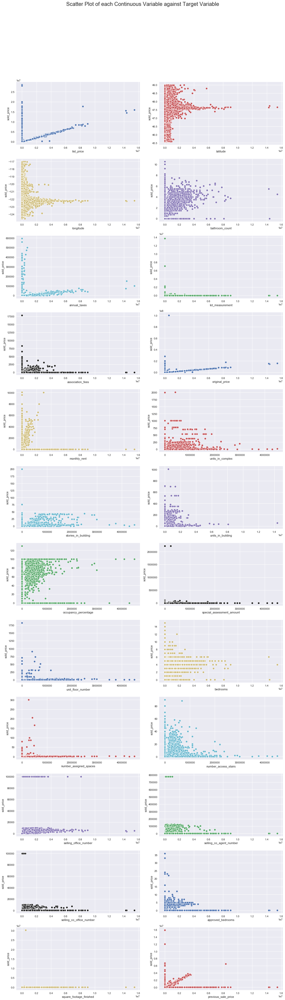

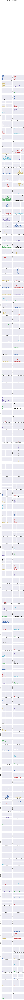

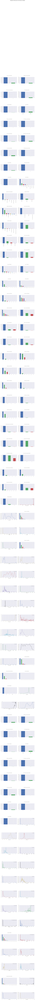

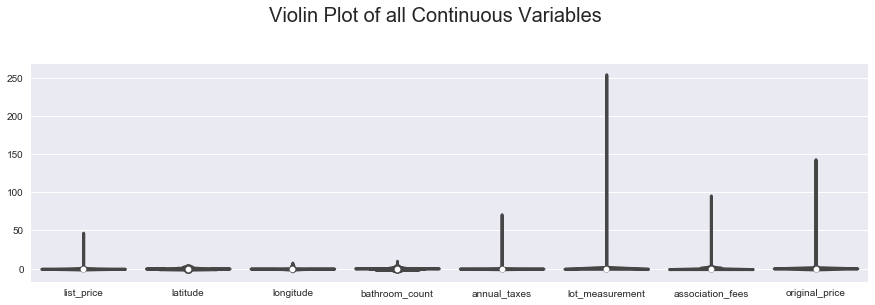

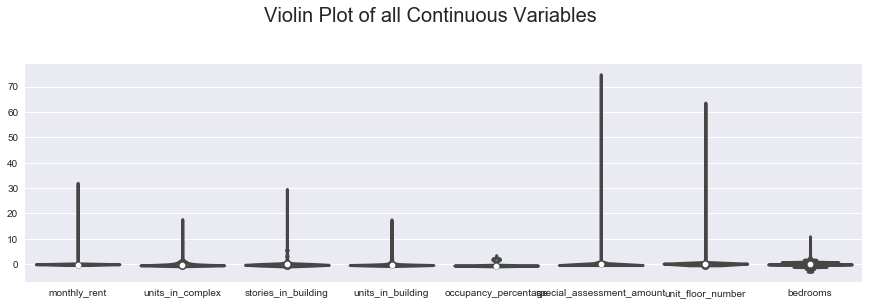

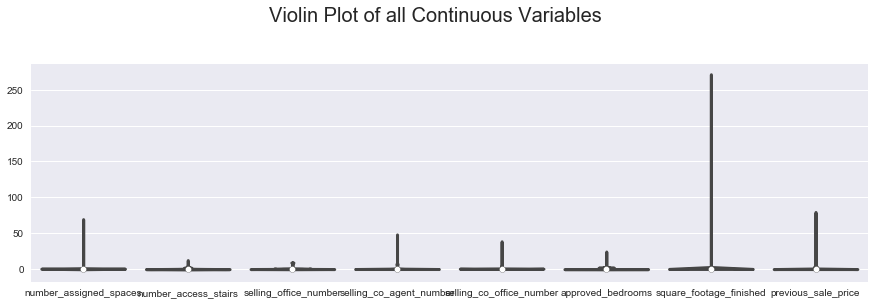

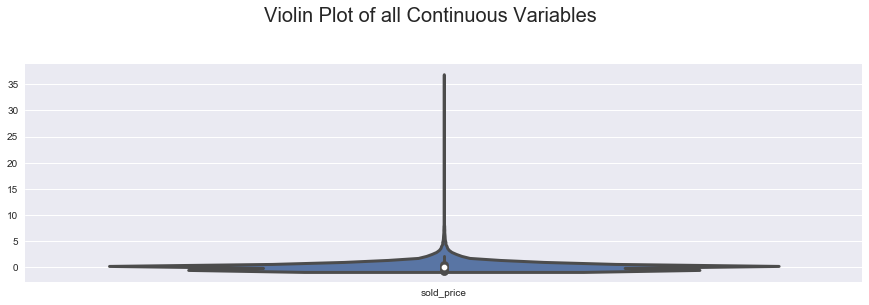

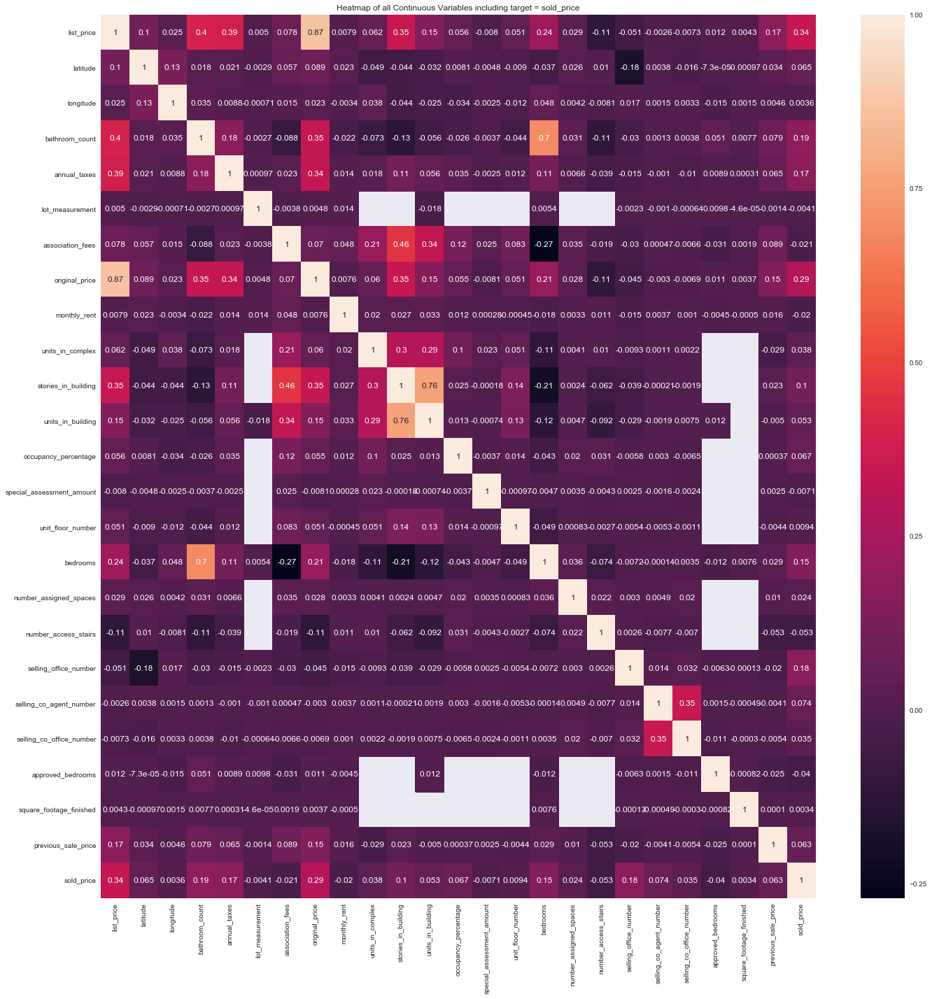

In [17]:
dft = AV.AutoViz(filename, sep, 'sold_price', train, header=0, verbose=2, lowess=False, chart_format='svg', max_rows_analyzed=150000, max_cols_analyzed=30)






In [48]:
!pip install -U seaborn

    100% |################################| 215kB 5.2MB/s ta 0:00:01
  Found existing installation: seaborn 0.8.1
    Uninstalling seaborn-0.8.1:
      Successfully uninstalled seaborn-0.8.1
You are using pip version 18.1, however version 19.3 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.


In [12]:
import pandas as pd

In [16]:
train= pd.read_csv("lib/data/tbl_property_details_mls_2019.csv")

In [14]:
train

,unfinished_sq_foot,fireplaces_count,lot_size,year_built,latitude,longitude,area,covered_parking,sold_price,bedroom_count,...,community_name_imputed,garage_imputed,exterior_imputed,city_name_imputed,energy_source_imputed,county_imputed,roof_imputed,floor_covering_imputed,heating_cooling_imputed,property_type_imputed
0,0.0,1.0,12468,2007.0,47.771158,-121.485155,600,1.0,230000.0,2,...,Sammamish,Garage-Attached,Wood,Gold Bar,Electric,King,Metal,Hardwood,Forced Air,Residential
1,3.0,186.0,5971,NaN,47.775793,-122.163872,600,2019.0,999950.0,5,...,SeaTac,Garage-Attached,Log,Woodinville,Electric,King,N,1,"Forced Air, 90%+ High Efficiency, Tankless Wat...",Residential
2,0.0,1.0,0,2019.0,47.542905,-122.159075,500,0.0,824800.0,4,...,Newcastle,Garage-Attached,Cement Planked,Newcastle,"Electric, Natural Gas",King,Composition,"Ceramic Tile, Hardwood, Wall to Wall Carpet","Central A/C, Forced Air, Heat Pump, 90%+ High ...",Condominium
3,0.0,0.0,855,2018.0,47.662371,-122.339990,705,1.0,710000.0,2,...,Fremont,None,"Brick, Cement Planked, Wood",Seattle,Electric,King,Flat,"Ceramic Tile, Hardwood, Wall to Wall Carpet","Wall, Ductless HP-Mini Split",Residential
4,0.0,0.0,1,2019.0,47.622021,-122.130781,530,0.0,832845.0,3,...,Bellevue,Garage-Attached,"Cement/Concrete, Stone, Wood",Bellevue,Electric,King,Composition,"Ceramic Tile, Hardwood, Vinyl, Wall to Wall Ca...","Baseboard, Ductless HP-Mini Split",Condominium
5,0.0,0.0,10888,1962.0,47.775551,-122.220958,610,1.0,693000.0,4,...,Bothell,Garage-Attached,"Metal/Vinyl, Wood",Bothell,Natural Gas,King,Composition,"Ceramic Tile, Laminate, Wall to Wall Carpet",Forced Air,Residential
6,960.0,3.0,6000,1909.0,47.647185,-122.320024,390,1.0,915000.0,4,...,Eastlake,Off Street,Wood,Seattle,"Electric, Natural Gas",King,Composition,"Ceramic Tile, Hardwood, Slate, Wall to Wall Ca...",Radiator,Residential
7,0.0,1.0,5000,2019.0,47.572081,-122.023044,540,2.0,1440000.0,6,...,Sammamish,Garage-Attached,Cement Planked,Sammamish,Natural Gas,King,Composition,"Ceramic Tile, Hardwood, Wall to Wall Carpet","Forced Air, 90%+ High Efficiency",Residential
8,0.0,1.0,4774,2019.0,47.572009,-122.024084,540,2.0,1450000.0,4,...,Sammamish,Garage-Attached,"Cement Planked, Stone, Wood Products",Sammamish,"Electric, Natural Gas",King,Composition,"Ceramic Tile, Hardwood, Wall to Wall Carpet","Central A/C, Forced Air, 90%+ High Efficiency",Residential
9,0.0,3.0,29424,1987.0,47.720221,-122.122257,600,3.0,1720000.0,4,...,Redmond,Garage-Attached,"Brick, Wood",Redmond,Natural Gas,King,Cedar Shake,"Hardwood, Wall to Wall Carpet","Central A/C, Forced Air",Residential
